In [1]:
import anndata as ad
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=120, facecolor='white')

scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.20.3 scipy==1.7.3 pandas==1.4.1 scikit-learn==1.0.2 statsmodels==0.12.2 python-igraph==0.9.9 pynndescent==0.5.6


In [2]:
PA111 = sc.read_h5ad('/store/Projects/pantovski/IL10/Young_naive/data/Ambient_RNA_Cleaned/PA111_cleaned.h5ad')
PA112 = sc.read_h5ad('/store/Projects/pantovski/IL10/Young_naive/data/Ambient_RNA_Cleaned/PA112_cleaned.h5ad')
PA113 = sc.read_h5ad('/store/Projects/pantovski/IL10/Young_naive/data/Ambient_RNA_Cleaned/PA113_cleaned.h5ad')

PA111.var_names_make_unique()
PA112.var_names_make_unique()
PA113.var_names_make_unique()

PA111.obs.index = PA111.obs.index.map(lambda x: x.split('-')[0]+'-11')
PA112.obs.index = PA112.obs.index.map(lambda x: x.split('-')[0]+'-12')
PA113.obs.index = PA113.obs.index.map(lambda x: x.split('-')[0]+'-13')

Young_naive_Ambient_RNA_cleaned_join_inner = ad.concat([PA111, PA112, PA113], label="batch", keys=["PA111", "PA112", "PA113"], join="inner")
Young_naive_Ambient_RNA_cleaned_join_inner.obs.loc[Young_naive_Ambient_RNA_cleaned_join_inner.obs.batch.isin(['PA111', 'PA112', 'PA113']), 'Type'] = 'Young_naive'

In [3]:
adata_Il10RN = Young_naive_Ambient_RNA_cleaned_join_inner[(Young_naive_Ambient_RNA_cleaned_join_inner.to_df()['Il10ra'] == 0), :]
adata_Il10 = adata_Il10RN[(adata_Il10RN.to_df()['Il10'] > 0), :]

adata_Il10N = Young_naive_Ambient_RNA_cleaned_join_inner[(Young_naive_Ambient_RNA_cleaned_join_inner.to_df()['Il10'] == 0), :]
adata_Il10ra = adata_Il10N[(adata_Il10N.to_df()['Il10ra'] > 0), :]

adata_DN = adata_Il10N[(adata_Il10N.to_df()['Il10ra'] == 0), :]

Young_naive_Ambient_RNA_cleaned_join_inner = ad.concat([adata_Il10, adata_Il10ra, adata_DN], label="IL10", keys=["IL10_Young_naive", "IL10ra_Young_naive", "DN_Young_naive"])

In [4]:
Young_naive_Ambient_RNA_cleaned_join_inner

AnnData object with n_obs × n_vars = 27095 × 32285
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Type', 'IL10'

normalizing counts per cell
    finished (0:00:00)


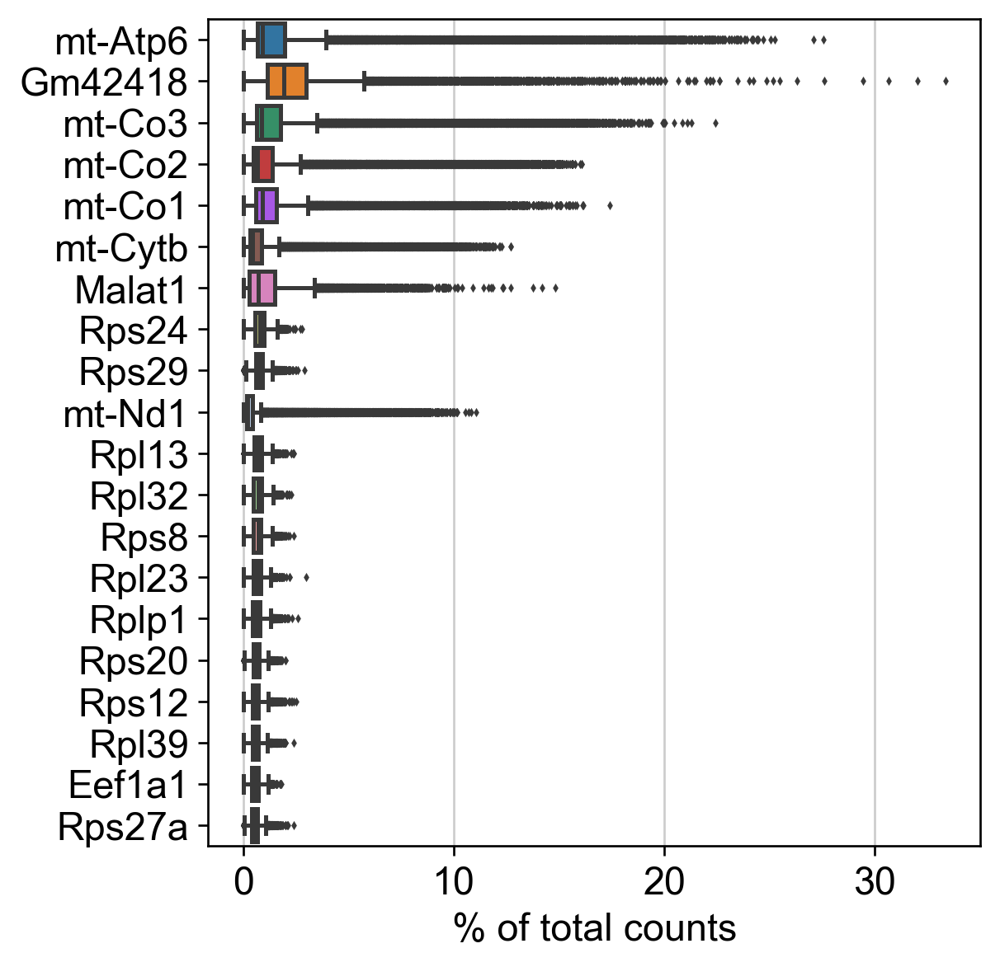

In [5]:
sc.pl.highest_expr_genes(Young_naive_Ambient_RNA_cleaned_join_inner, n_top=20)

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'Type' as categorical


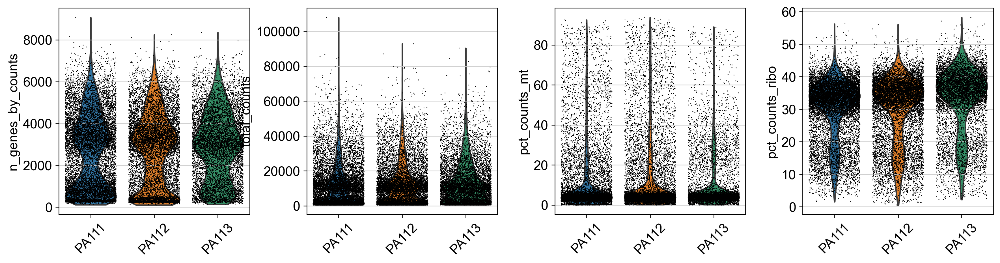

In [6]:
# mitochondrial genes
Young_naive_Ambient_RNA_cleaned_join_inner.var['mt'] = Young_naive_Ambient_RNA_cleaned_join_inner.var_names.str.startswith('mt-') 
# ribosomal genes
Young_naive_Ambient_RNA_cleaned_join_inner.var['ribo'] = Young_naive_Ambient_RNA_cleaned_join_inner.var_names.str.startswith(("Rps","Rpl"))

sc.pp.calculate_qc_metrics(Young_naive_Ambient_RNA_cleaned_join_inner, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)

# A violin plot of some of the computed quality measures:
#     the number of genes expressed in the count matrix
#     the total counts per cell
#     the percentage of counts in mitochondrial genes
#     the percentage of counts in ribosomal genes
sc.pl.violin(Young_naive_Ambient_RNA_cleaned_join_inner, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'], jitter=0.4, groupby = 'batch', rotation= 45)

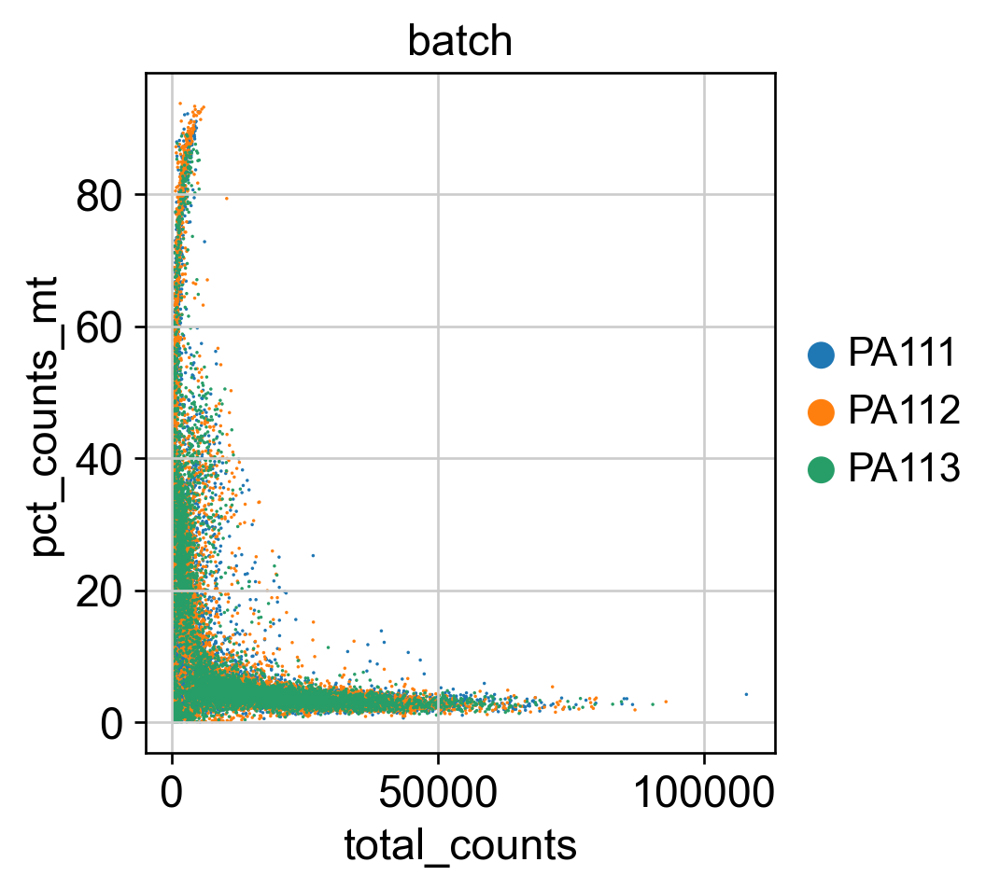

In [7]:
sc.pl.scatter(Young_naive_Ambient_RNA_cleaned_join_inner, x='total_counts', y='pct_counts_mt', color='batch')

In [8]:
#Basic filtering:
sc.pp.filter_cells(Young_naive_Ambient_RNA_cleaned_join_inner, min_genes=200)
sc.pp.filter_genes(Young_naive_Ambient_RNA_cleaned_join_inner, min_cells=3)

filtered out 110 cells that have less than 200 genes expressed
filtered out 11881 genes that are detected in less than 3 cells


In [9]:
Young_naive_Ambient_RNA_cleaned_join_inner.shape

(26985, 20404)

In [10]:
# Remove cells that have too many mitochondrial genes expressed or too little ribosomal genes expressed:
Young_naive_Ambient_RNA_cleaned_join_inner = Young_naive_Ambient_RNA_cleaned_join_inner[Young_naive_Ambient_RNA_cleaned_join_inner.obs.pct_counts_mt < 10, :]
Young_naive_Ambient_RNA_cleaned_join_inner = Young_naive_Ambient_RNA_cleaned_join_inner[Young_naive_Ambient_RNA_cleaned_join_inner.obs.pct_counts_ribo > 5, :]

In [11]:
Young_naive_Ambient_RNA_cleaned_join_inner.shape

(20453, 20404)

Trying to set attribute `.var` of view, copying.


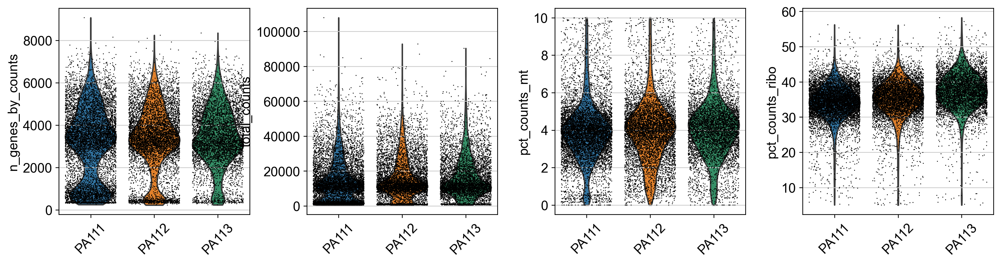

In [12]:
# mitochondrial genes
Young_naive_Ambient_RNA_cleaned_join_inner.var['mt'] = Young_naive_Ambient_RNA_cleaned_join_inner.var_names.str.startswith('mt-') 
# ribosomal genes
Young_naive_Ambient_RNA_cleaned_join_inner.var['ribo'] = Young_naive_Ambient_RNA_cleaned_join_inner.var_names.str.startswith(("Rps","Rpl"))

sc.pp.calculate_qc_metrics(Young_naive_Ambient_RNA_cleaned_join_inner, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)

sc.pl.violin(Young_naive_Ambient_RNA_cleaned_join_inner, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'], jitter=0.4, groupby = 'batch', rotation= 45)

In [13]:
np.median(Young_naive_Ambient_RNA_cleaned_join_inner.obs.n_genes_by_counts)

3366.0

In [14]:
from statsmodels import robust
robust.mad(Young_naive_Ambient_RNA_cleaned_join_inner.obs.n_genes_by_counts)

1401.0590964877938

In [15]:
# Young_naive_Ambient_RNA_cleaned_join_inner = Young_naive_Ambient_RNA_cleaned_join_inner[Young_naive_Ambient_RNA_cleaned_join_inner.obs.n_genes_by_counts > 1000, :]

In [16]:
# As the level of expression of mitochondrial genes and Malat1 are judged as mainly technical, it can be wise to remove them from the dataset bofore any further analysis.
malat1 = Young_naive_Ambient_RNA_cleaned_join_inner.var_names.str.startswith('Malat1')
Gm42418 = Young_naive_Ambient_RNA_cleaned_join_inner.var_names.str.startswith('Gm42418')
mito_genes = Young_naive_Ambient_RNA_cleaned_join_inner.var_names.str.startswith('mt-')

remove = np.add(mito_genes, malat1)
remove = np.add(remove, Gm42418)

keep = np.invert(remove)

Young_naive_Ambient_RNA_cleaned_join_inner_no_mt = Young_naive_Ambient_RNA_cleaned_join_inner[:,keep]

In [17]:
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt.shape

(20453, 20389)

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...


Trying to set attribute `.obs` of view, copying.


Automatically set threshold at doublet score = 0.59
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 7.1%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 3.9%
Elapsed time: 28.3 seconds


(<Figure size 960x360 with 2 Axes>,
 array([<AxesSubplot:title={'center':'Observed transcriptomes'}, xlabel='Doublet score', ylabel='Prob. density'>,
        <AxesSubplot:title={'center':'Simulated doublets'}, xlabel='Doublet score', ylabel='Prob. density'>],
       dtype=object))

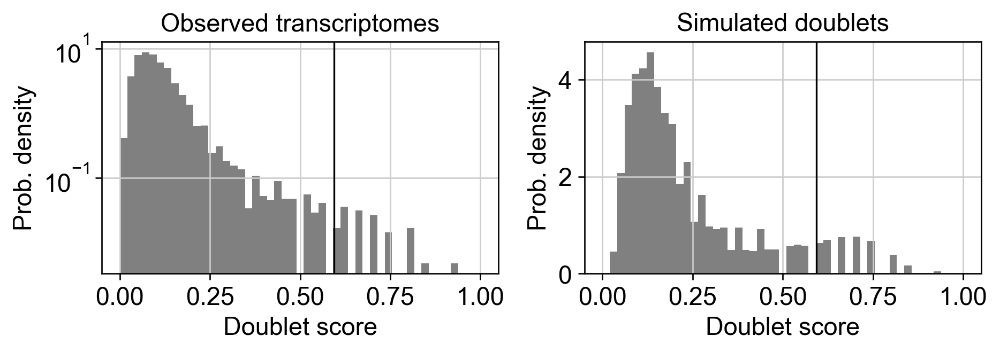

In [18]:
# Predict doublets
scrub = scr.Scrublet(Young_naive_Ambient_RNA_cleaned_join_inner_no_mt.X)
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt.obs['doublet_scores'], Young_naive_Ambient_RNA_cleaned_join_inner_no_mt.obs['predicted_doublets'] = scrub.scrub_doublets()
scrub.plot_histogram()

In [19]:
sum(Young_naive_Ambient_RNA_cleaned_join_inner_no_mt.obs['predicted_doublets'])

56

In [20]:
# add in column with singlet/doublet instead of True/False
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt.obs['doublet_info'] = Young_naive_Ambient_RNA_cleaned_join_inner_no_mt.obs["predicted_doublets"].astype(str)
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt = Young_naive_Ambient_RNA_cleaned_join_inner_no_mt[Young_naive_Ambient_RNA_cleaned_join_inner_no_mt.obs['doublet_info'] == 'False',:]

In [21]:
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt.shape

(20397, 20389)

In [22]:
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt.obs.pop('doublet_info')
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt.obs.pop('doublet_scores')
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt.obs.pop('predicted_doublets')

TAACCAGCAGACGGAT-11    False
AACCTTTGTAGCACAG-12    False
TCAGTTTGTTTATGCG-12    False
TCTATCAAGATCCTAC-12    False
GCACGGTTCCCGAAAT-13    False
                       ...  
TTTGGTTTCAATCCAG-13    False
TTTGGTTTCACATCAG-13    False
TTTGGTTTCTCCGTGT-13    False
TTTGTTGTCAAAGAAC-13    False
TTTGTTGTCTACTTCA-13    False
Name: predicted_doublets, Length: 20397, dtype: bool

In [23]:
# Save the result.
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt.write('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_nonlognorm_join_inner_200_3_10_5_scrublet_no_mt_raw.h5ad')

In [24]:
import anndata as ad
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=120, facecolor='white')

scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.20.3 scipy==1.7.3 pandas==1.4.1 scikit-learn==1.0.2 statsmodels==0.12.2 python-igraph==0.9.9 pynndescent==0.5.6


In [25]:
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt = sc.read_h5ad('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_nonlognorm_join_inner_200_3_10_5_scrublet_no_mt_raw.h5ad')

In [26]:
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent = Young_naive_Ambient_RNA_cleaned_join_inner_no_mt[:, ((Young_naive_Ambient_RNA_cleaned_join_inner_no_mt.X > 2).sum(axis=0) / Young_naive_Ambient_RNA_cleaned_join_inner_no_mt.shape[0] ) > 0.05]

In [27]:
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent

View of AnnData object with n_obs × n_vars = 20397 × 3388
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Type', 'IL10', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'batch_colors'

In [28]:
# Total-count normalize (library-size correct) the data matrix X to 10,000 reads per cell, so that counts become comparable among cells.
sc.pp.normalize_total(Young_naive_Ambient_RNA_cleaned_join_inner_no_mt, target_sum=1e4)

# Logarithmize the data:
sc.pp.log1p(Young_naive_Ambient_RNA_cleaned_join_inner_no_mt)

normalizing counts per cell
    finished (0:00:00)


extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


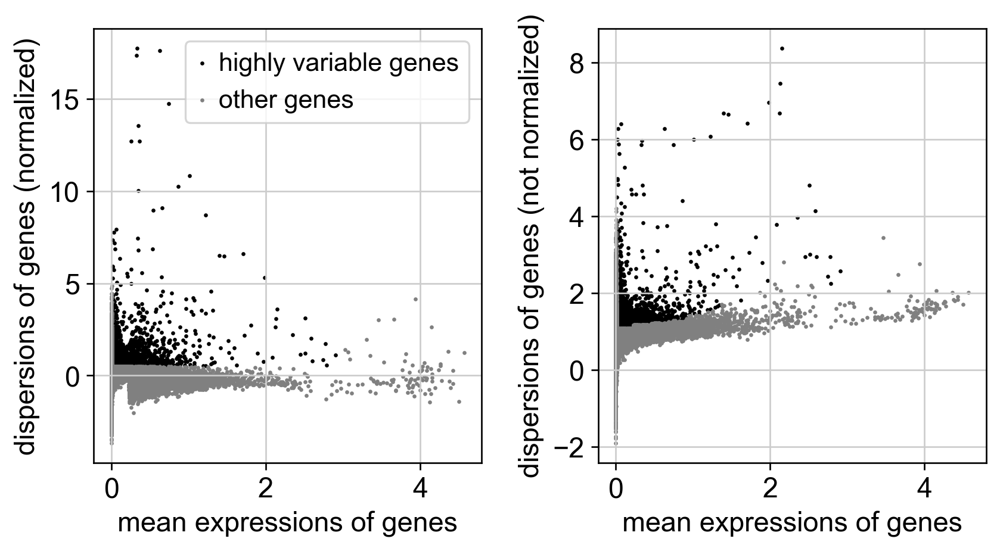

In [29]:
# Identify highly-variable genes.
sc.pp.highly_variable_genes(Young_naive_Ambient_RNA_cleaned_join_inner_no_mt, min_mean=0.0125, max_mean=3, min_disp=0.5)

sc.pl.highly_variable_genes(Young_naive_Ambient_RNA_cleaned_join_inner_no_mt)

In [30]:
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt

AnnData object with n_obs × n_vars = 20397 × 20389
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Type', 'IL10', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'log1p', 'hvg'

In [32]:
# Set the .raw attribute of the AnnData object to the normalized and logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object.
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt.raw = Young_naive_Ambient_RNA_cleaned_join_inner_no_mt

# The result of the previous highly-variable-genes detection is stored as an annotation in .var.highly_variable and auto-detected by PCA and hence, sc.pp.neighbors and subsequent manifYoung/graph tools. In that case, the step actually do the filtering below is unnecessary, too.

# Actually do the filtering
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress = Young_naive_Ambient_RNA_cleaned_join_inner_no_mt[:, Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent.var.index]

#Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_hvgo_regress = Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent[:, Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent.var.highly_variable]
#Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress = Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent
# Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.
sc.pp.regress_out(Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use


/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:7: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,
/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:7: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,


    finished (0:00:44)


In [33]:
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress

AnnData object with n_obs × n_vars = 20397 × 3388
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Type', 'IL10', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'log1p', 'hvg'

In [34]:
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat = Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress
# BATCH CORRECTION USING ComBat
# run combat
sc.pp.combat(Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat, key='batch')

Standardizing Data across genes.

Found 3 batches

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data



In [35]:
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat

AnnData object with n_obs × n_vars = 20397 × 3388
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Type', 'IL10', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'log1p', 'hvg'

In [36]:
# Save the result.
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat.write('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_lognorm_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_raw_SingleR.h5ad')

In [37]:
# PCA, TSNE, UMAP and Clustering

In [87]:
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat = sc.read_h5ad('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_lognorm_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_raw_SingleR.h5ad')
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat.raw = Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat

df = pd.read_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_cell_types_lognorm_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_raw_SingleR.csv", index_col=0)
labels = df['labels']
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat.obs['cell_type'] = labels
pd.crosstab(index=Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat.obs.batch, columns=Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat.obs.cell_type)

cell_type,CLP,CMP,Flk2n,Flk2p,GMP,HSC,MEP
batch,,,,,,,
PA111,1842,1539,1053,733,805,1863,161
PA112,1694,782,926,671,693,1896,104
PA113,1004,644,977,733,634,1564,79


In [88]:
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat.raw = Young_naive_Ambient_RNA_cleaned_join_inner_no_mt

In [89]:
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat.write('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_lognorm_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_raw_SingleR_raw_after.h5ad')

# Scale each gene to unit variance. Clip values exceeding standard deviation 10.
sc.pp.scale(Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat, max_value=10)

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cell_type' as categorical


In [90]:
# Principal component analysis

# Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.
sc.tl.pca(Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat, svd_solver='arpack')

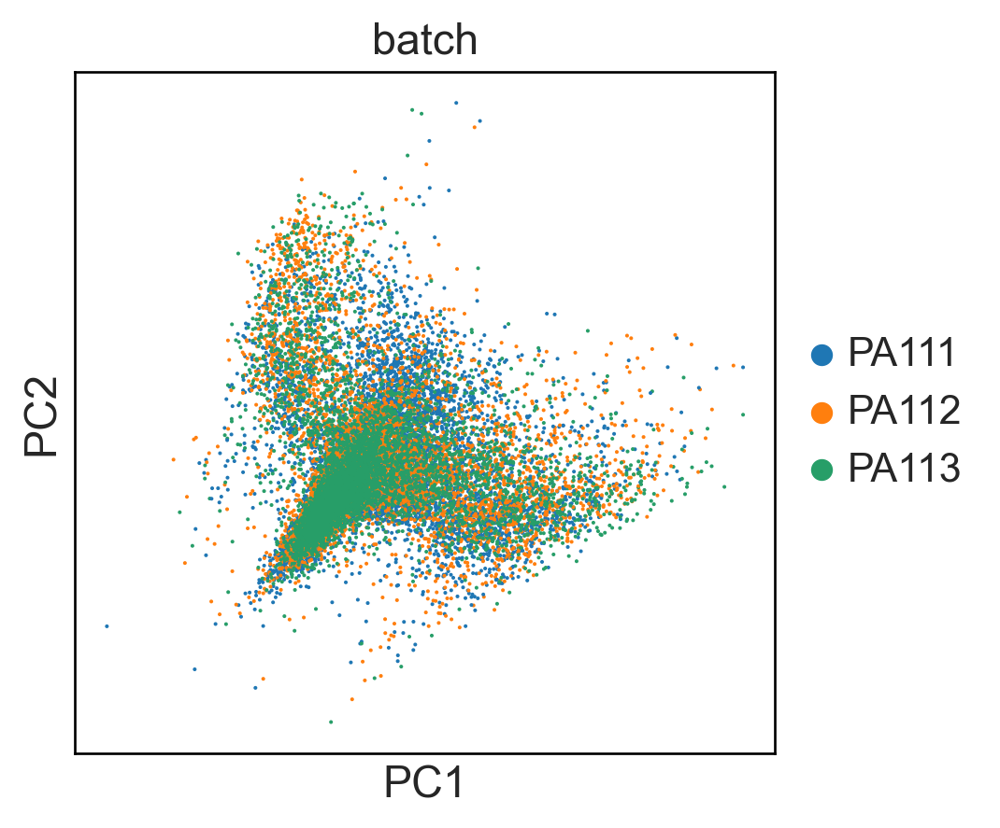

In [108]:
sc.settings.set_figure_params(dpi=120, facecolor='white')

# We can make a scatter plot in the PCA coordinates, but we will not use that later on.
sc.pl.pca(Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat, color='batch')

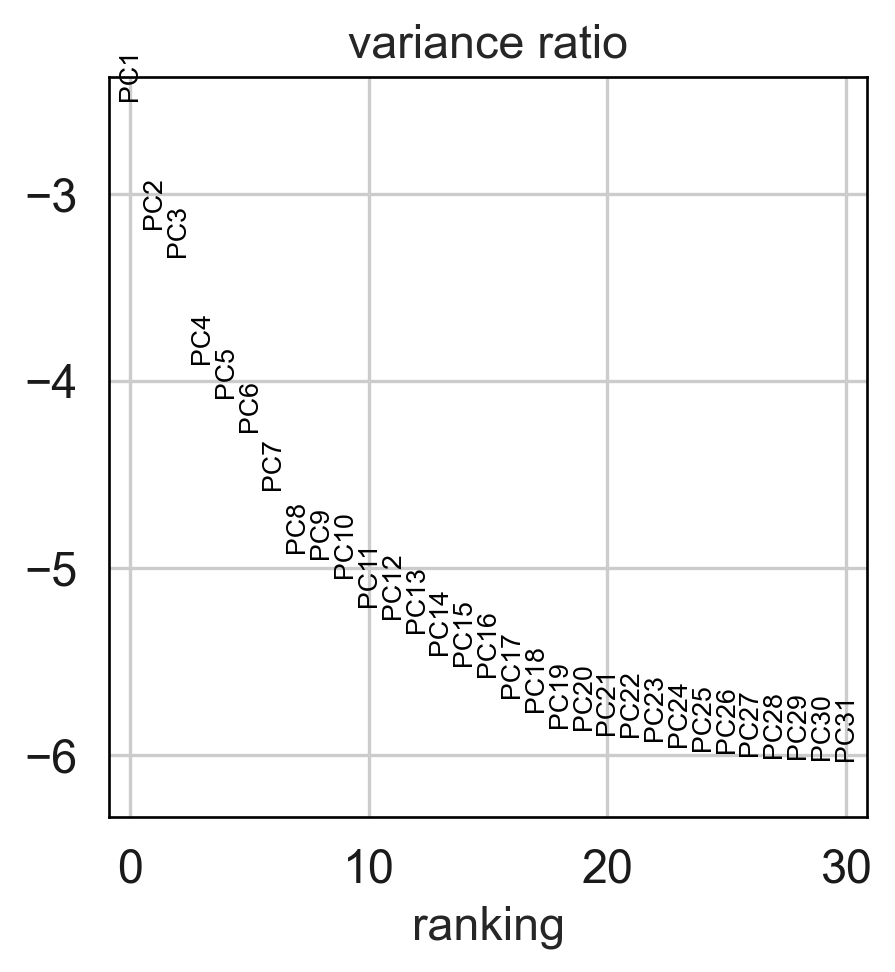

In [109]:
# Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function sc.tl.louvain() or tSNE sc.tl.tsne(). In our experience, often a rough estimate of the number of PCs does fine.
sc.pl.pca_variance_ratio(Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat, log=True)

In [92]:
# Computing the neighborhood graph

#Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. You might simply use default values here. For the sake of reproducing Seurat’s results, let’s take the following values.
sc.pp.neighbors(Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat, n_neighbors=15, n_pcs=45)

computing neighbors
    using 'X_pca' with n_pcs = 45
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


In [93]:
sc.tl.tsne(Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat, n_pcs = 30)

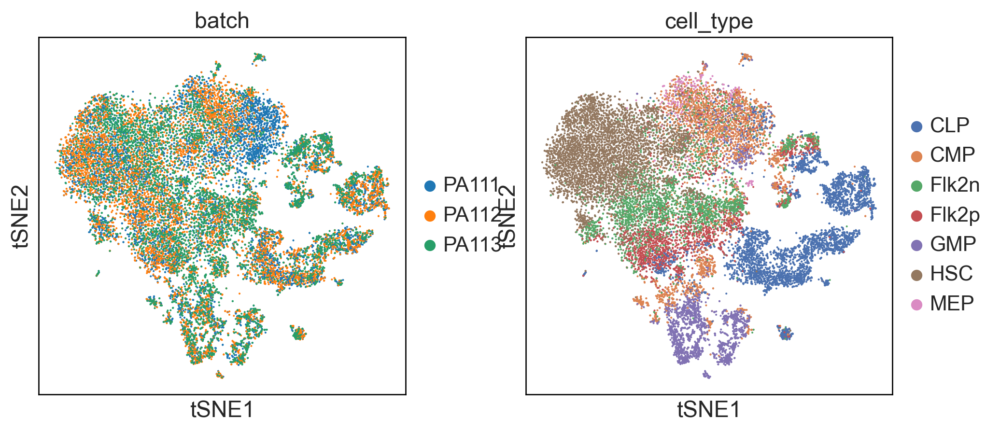

In [110]:
sc.pl.tsne(Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat, color=['batch', 'cell_type'])

In [94]:
# Embedding the neighborhood graph

# We suggest embedding the graph in two dimensions using UMAP (McInnes et al., 2018), see below. It is potentially more faithful to the global connectivity of the manifYoung than tSNE, i.e., it better preserves trajectories. In some ocassions, you might still observe disconnected clusters and similar connectivity violations. They can usually be remedied by running:

# tl.paga(adata)
# pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
# tl.umap(adata, init_pos='paga')

sc.tl.umap(Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat)

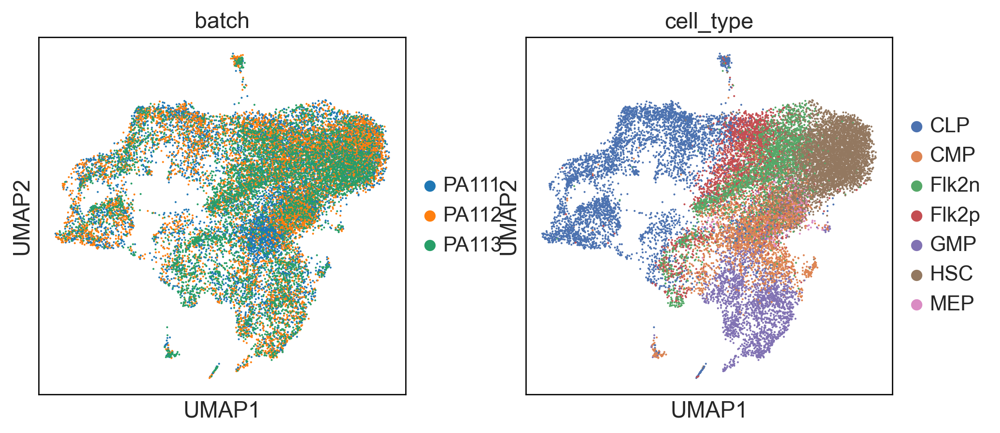

In [111]:
sc.pl.umap(Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat, color=['batch', 'cell_type'])

In [95]:
# Clustering the neighborhood graph

# As with Seurat and many other frameworks, we recommend the Leiden graph-clustering method (community detection based on optimizing modularity) by Traag *et al.* (2018). Note that Leiden clustering directly clusters the neighborhood graph of cells, which we already computed in the previous section.
sc.tl.leiden(Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat, resolution = 0.2, key_added = "leiden_0.2")

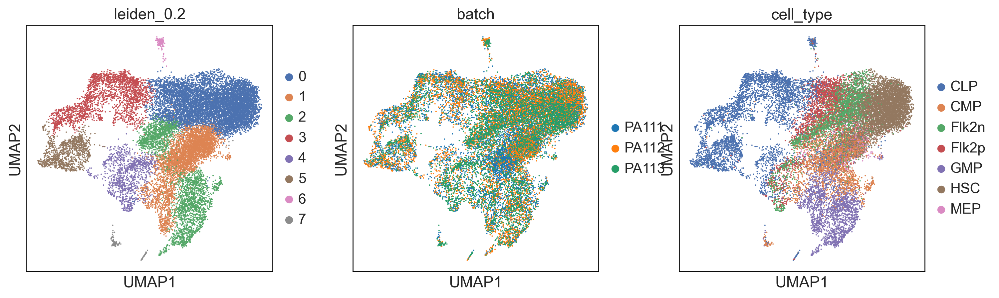

In [112]:
# Plot the clusters:
sc.pl.umap(Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat, color=['leiden_0.2', 'batch', 'cell_type'])

In [96]:
#Save the clusters.
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat.obs.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_clusters_join_inner_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv")

In [97]:
# Save the result.
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat.write('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_join_inner_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.h5ad')

In [1]:
# DGE

import numpy as np
import pandas as pd
import scanpy as sc

In [2]:
Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat = sc.read_h5ad('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_join_inner_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.h5ad')

Young_naive_Ambient_RNA_cleaned_HSC = Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat[Young_naive_Ambient_RNA_cleaned_join_inner_no_mt_hvgo_regress_combat.obs.cell_type == 'HSC']
Young_naive_Ambient_RNA_cleaned_HSC.obs

,orig.ident,nCount_RNA,nFeature_RNA,batch,Type,IL10,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,n_genes,cell_type,leiden_0.2
AAAGTGATCACACCCT-11,0,17609.675426,4711,PA111,Young_naive,IL10ra_Young_naive,4711,17609.673828,788.216919,4.476045,5724.643066,32.508514,4711,HSC,0
ACCACAAGTTCCAAAC-11,0,27618.129477,5553,PA111,Young_naive,IL10ra_Young_naive,5552,27617.128906,995.791931,3.605704,10138.265625,36.710064,5553,HSC,0
ACGTACACACAGAGCA-11,0,7730.734446,2336,PA111,Young_naive,IL10ra_Young_naive,2336,7730.734375,317.804626,4.110924,3245.859131,41.986427,2336,HSC,0
ACTATCTGTCGTTGCG-11,0,11673.262536,3244,PA111,Young_naive,IL10ra_Young_naive,3244,11673.262695,466.907135,3.999800,4654.256348,39.871086,3244,HSC,0
AGACTCAAGGCATGGT-11,0,7638.081853,2587,PA111,Young_naive,IL10ra_Young_naive,2587,7638.082031,538.748962,7.053459,2667.304688,34.921131,2587,HSC,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGATCTCAGTGTTG-13,0,11883.202541,2820,PA113,Young_naive,DN_Young_naive,2820,11883.203125,569.049622,4.788689,5263.166504,44.290810,2820,HSC,0
TTTGATCTCATCAGTG-13,0,3723.946988,1475,PA113,Young_naive,DN_Young_naive,1475,3723.947021,314.859619,8.454997,1213.394165,32.583549,1475,HSC,1
TTTGGAGAGGACTAAT-13,0,8728.328826,2547,PA113,Young_naive,DN_Young_naive,2547,8728.330078,450.654816,5.163127,3659.852051,41.930725,2547,HSC,0
TTTGGTTGTCCAGTTA-13,0,10336.811444,3333,PA113,Young_naive,DN_Young_naive,3333,10336.811523,389.319031,3.766336,3315.326660,32.073013,3333,HSC,0


In [3]:
pd.crosstab(index=Young_naive_Ambient_RNA_cleaned_HSC.obs.batch, columns=Young_naive_Ambient_RNA_cleaned_HSC.obs.IL10)

IL10,IL10ra_Young_naive,DN_Young_naive
batch,,
PA111,51,1812
PA112,56,1840
PA113,14,1550


In [4]:
expression_matrix = pd.DataFrame(Young_naive_Ambient_RNA_cleaned_HSC.X)
expression_matrix.columns = Young_naive_Ambient_RNA_cleaned_HSC.var.index
expression_matrix = expression_matrix.T
gene_list = list(Young_naive_Ambient_RNA_cleaned_HSC.var.index)
column_values = pd.Series(gene_list)
expression_matrix.insert(loc=0, column='Description', value=column_values)
expression_matrix.insert(loc=0, column='NAME', value=gene_list)
expression_matrix['NAME'] = expression_matrix['NAME'].str.upper()
expression_matrix.index = range(len(expression_matrix.index))

expression_matrix.to_csv('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_HSC_expression_matrix_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.txt', index=None, sep='\t', mode='a')

In [5]:
phenotype_list = list(Young_naive_Ambient_RNA_cleaned_HSC.obs.IL10)
first_row = [Young_naive_Ambient_RNA_cleaned_HSC.shape[0], '3', '1']
second_row = ['#', 'IL10_Young_naive', 'IL10ra_Young_naive', 'DN_Young_naive']

import csv

with open('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_HSC_phenotype_list_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.cls', 'w') as f:
      
    # using csv.writer method from CSV package
    write = csv.writer(f, delimiter=' ')
      
    write.writerow(first_row)
    write.writerow(second_row)
    write.writerow(phenotype_list)

In [6]:
import gseapy as gp
gene_set_names = gp.get_library_name(organism='Mouse')

In [7]:
groups = ['IL10ra_Young_naive', 'DN_Young_naive']
IL10ra_vs_DN_GSEA = Young_naive_Ambient_RNA_cleaned_HSC[Young_naive_Ambient_RNA_cleaned_HSC.obs.IL10.isin(groups)]

In [8]:
expression_matrix_IL10ra_vs_DN = pd.DataFrame(IL10ra_vs_DN_GSEA.X)
expression_matrix_IL10ra_vs_DN.columns = IL10ra_vs_DN_GSEA.var.index
expression_matrix_IL10ra_vs_DN = expression_matrix_IL10ra_vs_DN.T
gene_list = list(IL10ra_vs_DN_GSEA.var.index)
column_values = pd.Series(gene_list)
expression_matrix_IL10ra_vs_DN.insert(loc=0, column='Description', value=column_values)
expression_matrix_IL10ra_vs_DN.insert(loc=0, column='NAME', value=gene_list)
expression_matrix_IL10ra_vs_DN['NAME'] = expression_matrix_IL10ra_vs_DN['NAME'].str.upper()
expression_matrix_IL10ra_vs_DN.index = range(len(expression_matrix_IL10ra_vs_DN.index))

In [9]:
phenotype_list_IL10ra_vs_DN = list(IL10ra_vs_DN_GSEA.obs.IL10)

In [10]:
gs_res_IL10ra_vs_DN = gp.gsea(data=expression_matrix_IL10ra_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Biological_Process_2021', # enrichr library names
                 cls= phenotype_list_IL10ra_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png',)

#access the dataframe results throught res2d attribute
gs_res_IL10ra_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_GSEA_GO_BP_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv', index=None)

significant_terms = gs_res_IL10ra_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:32:03,214 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,regulation of cyclin-dependent protein kinase ...,-0.638186,-2.118890,0.0,0.010548,54,19,CCNT1;CDKN1B;CDC37;CDKN1A;CCNI;CDKN2D;CCND3;BC...,CCNH;HSP90AB1;ACTB;MNAT1;GTPBP4;CCNA2;CCNB2;CC...
1,regulation of JNK cascade (GO:0046328),0.742677,2.113143,0.0,0.018757,105,15,NCOR1;MAP4K4;TAOK3;PYCARD;ITCH;CD27;MECOM;SDCB...,NCOR1;MAP4K4;TAOK3;PYCARD;ITCH;CD27;MECOM
2,phosphatidylinositol biosynthetic process (GO:...,0.686480,1.974069,0.0,0.075028,126,16,PIK3R1;PIGP;PLCG2;EFR3A;RAB5A;INPP5D;DPM2;SMG1...,PIK3R1;PIGP;PLCG2;EFR3A;RAB5A;INPP5D;DPM2;SMG1...
3,myeloid leukocyte differentiation (GO:0002573),0.617961,1.864006,0.0,0.142553,71,21,FOXP1;SPI1;CEBPA;CBFA2T3;MAPK14;EP300;TYROBP;P...,FOXP1;SPI1;CEBPA;CBFA2T3;MAPK14;EP300;TYROBP;P...
4,vascular endothelial growth factor receptor si...,0.577848,1.841768,0.0,0.145366,67,25,ROCK2;ABI1;PIK3R1;BRK1;MAPKAPK2;MAPK14;NCF4;WA...,ROCK2;ABI1;PIK3R1;BRK1;MAPKAPK2;MAPK14;NCF4;WA...
5,negative regulation of DNA-binding transcripti...,0.579578,1.899944,0.0,0.153182,143,29,SMAD7;KDM1A;ADGRG3;SPI1;PYCARD;HES6;TAF1;RBCK1...,SMAD7;KDM1A;ADGRG3;SPI1;PYCARD;HES6;TAF1;RBCK1...
6,regulation of phagocytosis (GO:0050764),0.642206,1.868852,0.0,0.166468,58,15,IL2RG;PYCARD;PTPRC;DOCK2;CD47;PRTN3;LYAR;CYBA;...,IL2RG;PYCARD;PTPRC;DOCK2;CD47;PRTN3;LYAR
7,maturation of SSU-rRNA (GO:0030490),-0.691431,-1.921298,0.0,0.195137,35,17,BMS1;UTP3;NOP14;NOL11;RPS14;LSM6;RPS16;NOB1;RP...,SNU13;RPS19;NGDN;RPS8;WDR46


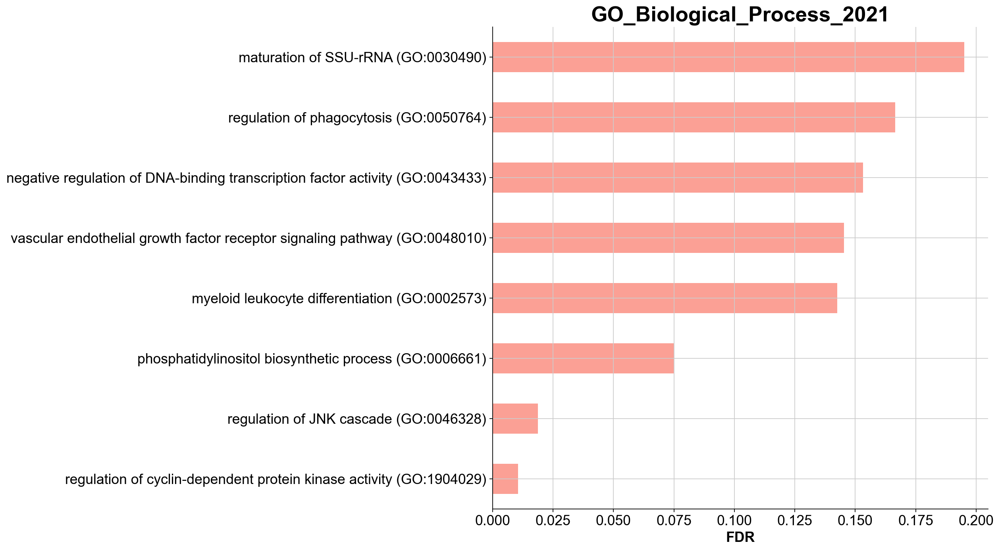

In [11]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Biological_Process_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10ra vs DN GSEA GO BP.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Biological_Process_2021', figsize=(10,10))

In [12]:
gs_res_IL10ra_vs_DN = gp.gsea(data=expression_matrix_IL10ra_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Molecular_Function_2021', # enrichr library names
                 cls= phenotype_list_IL10ra_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')

#access the dataframe results throught res2d attribute
gs_res_IL10ra_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_GSEA_GO_MF_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10ra_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:32:29,939 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,transcription regulatory region nucleic acid b...,0.541026,1.961914,0.000000,0.029174,212,49,NCOR1;MEF2C;NONO;SPI1;ZBTB20;CEBPA;CHD3;FOS;TF...,NCOR1;MEF2C;NONO;SPI1;ZBTB20;CEBPA;CHD3;FOS;TF...
1,snoRNA binding (GO:0030515),-0.656621,-1.769705,0.000000,0.092112,30,15,BMS1;NUDT4;NOP14;DDX21;NUDT1;NOP10;IMP3;DKC1;I...,IMP4;NOP56;NHP2;NUDT5;SNU13;NOP58;GAR1
2,mRNA binding (GO:0003729),-0.419653,-1.814305,0.000000,0.097230,263,123,ZFP36L1;EIF4G3;PKM;ZFP36;SF3B1;SRRM2;DDX3X;DDX...,RPL13A;RPS7;RBM8A;PURB;NUDT21;LARP1;HDLBP;FUBP...
3,transcription cis-regulatory region binding (G...,0.382764,1.579728,0.000000,0.148303,549,91,SATB1;NCOR1;VEZF1;FOXP1;CUX1;MEF2C;TCF3;NONO;S...,SATB1;NCOR1;VEZF1;FOXP1;CUX1;MEF2C;TCF3;NONO;S...
4,RNA polymerase II transcription regulatory reg...,0.379176,1.552659,0.023810,0.158839,1359,122,SATB1;BPTF;VEZF1;IKZF2;FOXP1;CUX1;NFAT5;MEF2C;...,SATB1;BPTF;VEZF1;IKZF2;FOXP1;CUX1;NFAT5;MEF2C;...
5,nuclear receptor binding (GO:0016922),0.469260,1.588066,0.025000,0.163932,120,41,NCOR1;FOXP1;PKN1;KDM1A;TACC1;TAF10;TAF11;TAF1;...,NCOR1;FOXP1;PKN1;KDM1A;TACC1;TAF10;TAF11;TAF1;...
6,ribosome binding (GO:0043022),-0.488260,-1.681436,0.020408,0.168872,48,25,SRP72;CCDC47;OXA1L;NAA15;SRP68;TMCO1;TMEM147;E...,SBDS;ERI1;SEC61A1;EIF3C;RACK1;SRP19;EIF2S1;FMR...
7,sequence-specific double-stranded DNA binding ...,0.394439,1.600490,0.000000,0.173426,712,107,NCOR1;MBNL2;FOXP1;CUX1;NFAT5;MEF2C;NONO;SPI1;Z...,NCOR1;MBNL2;FOXP1;CUX1;NFAT5;MEF2C;NONO;SPI1;Z...
8,mRNA 5'-UTR binding (GO:0048027),-0.604447,-1.826164,0.019231,0.173990,25,18,DDX3X;DHX36;CCT5;RPS14;RPL41;RPL26;SYNCRIP;SHM...,MRPS11;RPS7;LARP1;RPS13;FMR1;RPL5;NCL;RSL1D1;GNL3
9,"DNA-binding transcription repressor activity, ...",0.480017,1.619080,0.046512,0.184771,256,25,SATB1;FOXP1;TCF3;ZBTB20;BCL11A;ELK3;NFKB1;LRRF...,SATB1;FOXP1;TCF3;ZBTB20;BCL11A;ELK3;NFKB1;LRRF...


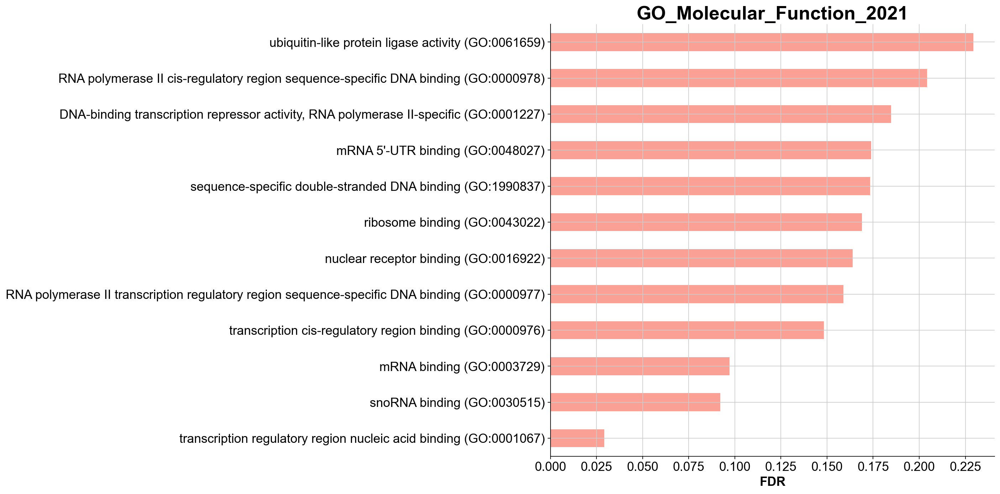

In [13]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Molecular_Function_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10ra vs DN GSEA GO MF.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Molecular_Function_2021', figsize=(10,10))

In [14]:
gs_res_IL10ra_vs_DN = gp.gsea(data=expression_matrix_IL10ra_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Cellular_Component_2021', # enrichr library names
                 cls= phenotype_list_IL10ra_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')


#access the dataframe results throught res2d attribute
gs_res_IL10ra_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_GSEA_GO_CC_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10ra_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:32:45,164 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,integral component of plasma membrane (GO:0005...,0.481389,2.002526,0.000000,0.009298,1454,95,FLT3;CD53;CALCRL;TNFRSF1A;TSPAN13;PGRMC1;SDC4;...,FLT3;CD53;CALCRL;TNFRSF1A;TSPAN13;PGRMC1;SDC4;...
1,phagocytic vesicle (GO:0045335),0.530039,1.914994,0.000000,0.009298,100,31,PGLYRP1;CTSS;FMNL1;B2M;NCF4;TAPBP;RAC2;RAB5A;S...,PGLYRP1;CTSS;FMNL1;B2M;NCF4;TAPBP;RAC2;RAB5A;S...
2,lytic vacuole (GO:0000323),0.505474,1.938603,0.000000,0.013947,219,46,CALCRL;CTSS;NPC2;TMEM59;CD34;PSAP;CD164;CTSD;C...,CALCRL;CTSS;NPC2;TMEM59;CD34;PSAP;CD164;CTSD;C...
3,basolateral plasma membrane (GO:0016323),0.610647,1.852789,0.000000,0.018596,151,18,SLC12A6;ATP2B1;ANXA2;TFRC;ERBIN;CTNNB1;CD81;CD...,SLC12A6;ATP2B1;ANXA2;TFRC;ERBIN;CTNNB1;CD81;CD...
4,lysosomal lumen (GO:0043202),0.607270,1.825872,0.000000,0.022316,86,18,CTSS;GM2A;SDC4;NPC2;PSAP;CTSD;CTSB;CD74;ATP13A...,CTSS;GM2A;SDC4;NPC2;PSAP;CTSD;CTSB;CD74;ATP13A...
5,early endosome membrane (GO:0031901),0.644697,1.766195,0.000000,0.032544,97,15,B2M;RAB5C;WLS;RAB21;RAB5A;SNX5;IFITM3;ATP13A3;...,B2M;RAB5C;WLS;RAB21;RAB5A;SNX5
6,secretory granule membrane (GO:0030667),0.427694,1.728866,0.020408,0.050476,274,75,CD53;PGRMC1;COPB1;ADGRG3;PSAP;DNAJC5;SELL;RAP1...,CD53;PGRMC1;COPB1;ADGRG3;PSAP;DNAJC5;SELL;RAP1...
7,lysosome (GO:0005764),0.387430,1.708262,0.019608,0.058114,477,95,CALCRL;CTSS;GM2A;SDC4;LAPTM4A;NPC2;TMEM59;CD34...,CALCRL;CTSS;GM2A;SDC4;LAPTM4A;NPC2;TMEM59;CD34...
8,nucleolus (GO:0005730),-0.379333,-1.811424,0.000000,0.063871,733,294,TUT4;HJURP;POLR2A;CHD3;PYCARD;SNAPC5;TOP2B;TAF...,POLR1D;CDKN2AIPNL;SIRT7;TSG101;RPL18;MEAF6;SBD...
9,small-subunit processome (GO:0032040),-0.606789,-1.771047,0.000000,0.085161,37,18,UTP11;PDCD11;UTP3;NOP14;IMP3;EMG1;UTP18;FCF1;F...,FCF1;FBL;UTP14A;RPS7;IMP4;NOP56;SNU13;NOP58;MP...


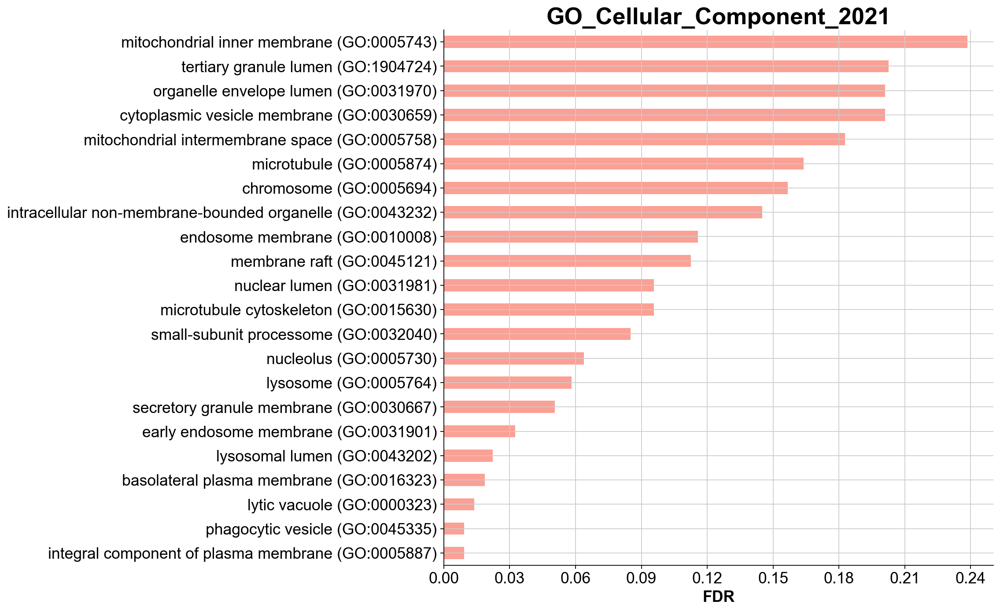

In [15]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10ra vs DN GSEA GO CC.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10))

In [16]:
gs_res_IL10ra_vs_DN = gp.gsea(data=expression_matrix_IL10ra_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='KEGG_2019_Mouse', # enrichr library names
                 cls= phenotype_list_IL10ra_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')


#access the dataframe results throught res2d attribute
gs_res_IL10ra_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_GSEA_KEGG_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10ra_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:32:59,593 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,Pyrimidine metabolism,-0.670082,-1.899338,0.000000,0.027596,58,18,NT5C3B;DCK;NT5C3;PNP;UCK2;DUT;DTYMK;RRM2;TYMS;...,RRM2;TYMS;CMPK1;UMPS;NT5C;NME4;RRM1;NME2;TK1;D...
1,Hematopoietic cell lineage,0.734106,2.028243,0.000000,0.029329,94,17,FLT3;DNTT;CD34;CD24A;H2-AA;H2-OB;TFRC;CD44;CD3...,FLT3;DNTT;CD34;CD24A;H2-AA;H2-OB;TFRC;CD44;CD37
2,Ribosome biogenesis in eukaryotes,-0.569078,-1.947034,0.000000,0.030662,115,40,REXO2;CSNK2A2;CSNK2B;TCOF1;BMS1;RPP25L;POP5;XR...,SBDS;UTP18;CSNK2A1;FCF1;DKC1;FBL;NMD3;WDR43;UT...
3,Lysosome,0.537268,1.891933,0.000000,0.058659,124,31,CTSS;GM2A;LAPTM4A;NPC2;PSAP;CD164;CTSD;CTSB;LA...,CTSS;GM2A;LAPTM4A;NPC2;PSAP;CD164;CTSD;CTSB;LA...
4,Human cytomegalovirus infection,0.427454,1.798433,0.000000,0.117317,255,77,ROCK2;TNFRSF1A;PIK3R1;B2M;CCL4;TMEM173;H2-Q6;P...,ROCK2;TNFRSF1A;PIK3R1;B2M;CCL4;TMEM173;H2-Q6;P...
5,Kaposi sarcoma-associated herpesvirus infection,0.410316,1.736970,0.000000,0.134915,216,71,TNFRSF1A;PIK3R1;PLCG2;ZFP36;FOS;H2-Q6;PPP3CA;M...,TNFRSF1A;PIK3R1;PLCG2;ZFP36;FOS;H2-Q6;PPP3CA;M...
6,Chemokine signaling pathway,0.465220,1.756867,0.000000,0.135648,197,48,ROCK2;PIK3R1;CCL4;RAP1B;CCL9;DOCK2;RAC2;RAP1A;...,ROCK2;PIK3R1;CCL4;RAP1B;CCL9;DOCK2;RAC2;RAP1A;...
7,Purine metabolism,-0.472909,-1.726037,0.000000,0.149221,136,34,PKM;GUK1;IMPDH1;ADSSL1;ITPA;DGUOK;NT5C3B;DCK;A...,ATIC;AK6;GART;NT5C;NUDT5;NME4;APRT;RRM1;NME2;NME1
8,Cell adhesion molecules (CAMs),0.625484,1.699621,0.018868,0.156423,170,20,SDC4;CD34;SELL;H2-Q6;PTPRC;H2-AA;H2-T22;H2-OB;...,SDC4;CD34;SELL;H2-Q6;PTPRC;H2-AA;H2-T22;H2-OB;...
9,Leukocyte transendothelial migration,0.439249,1.595880,0.000000,0.157927,115,36,ROCK2;RHOH;PIK3R1;PLCG2;RAP1B;MAPK14;NCF4;MYL1...,ROCK2;RHOH;PIK3R1;PLCG2;RAP1B;MAPK14;NCF4;MYL1...


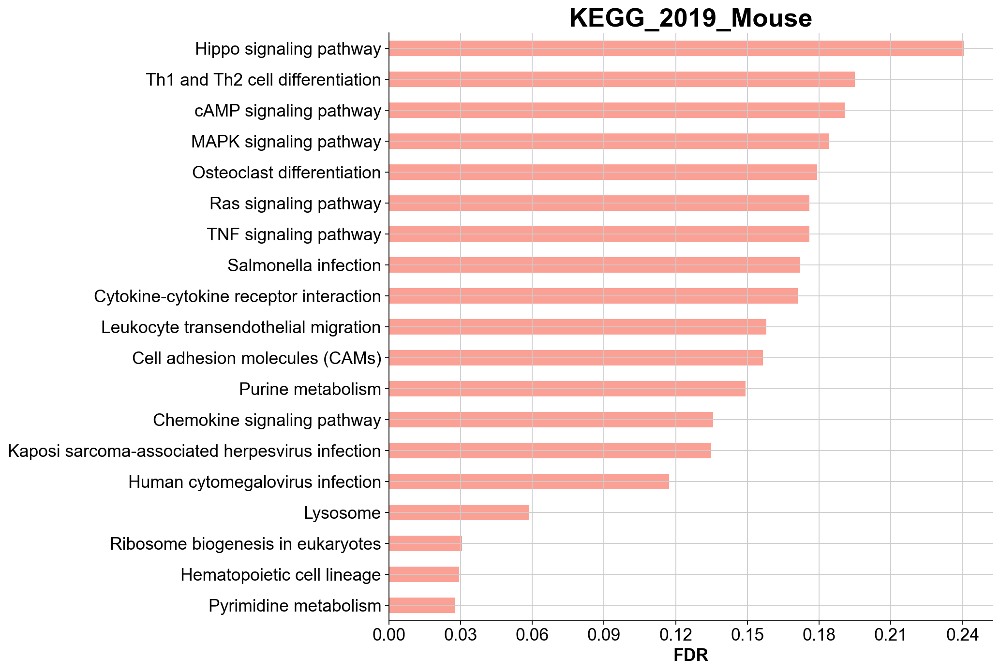

In [17]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10ra vs DN GSEA KEGG.png')

gp.barplot(top30, column='FDR', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10))

In [18]:
gs_res_IL10ra_vs_DN = gp.gsea(data=expression_matrix_IL10ra_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='WikiPathways_2019_Mouse', # enrichr library names
                 cls= phenotype_list_IL10ra_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')

#access the dataframe results throught res2d attribute
gs_res_IL10ra_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_GSEA_WIKI_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10ra_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:33:13,432 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,Spinal Cord Injury WP2432,0.487250,1.640363,0.000000,0.118374,99,24,ROCK2;ZFP36;FOS;BTG2;PPP3CA;PTPRA;CD47;EGR1;RH...,ROCK2;ZFP36;FOS;BTG2;PPP3CA;PTPRA;CD47
1,Insulin Signaling WP65,0.407288,1.584983,0.023256,0.134157,159,40,PIK3R1;MAP4K4;FOS;RPS6KA1;CBL;MAPK14;RAC2;GSK3...,PIK3R1;MAP4K4;FOS;RPS6KA1;CBL;MAPK14;RAC2;GSK3...
2,Alzheimers Disease WP2075,0.528101,1.655045,0.000000,0.144679,75,18,TNFRSF1A;PPP3CA;APH1A;ADAM10;GSK3B;MAPK3;APOE;...,TNFRSF1A;PPP3CA;APH1A;ADAM10;GSK3B
3,Microglia Pathogen Phagocytosis Pathway WP3626,0.527773,1.702885,0.000000,0.144679,41,19,PIK3R1;PLCG2;NCF4;TYROBP;RAC2;RAC1;VAV1;PIK3CD...,PIK3R1;PLCG2;NCF4;TYROBP;RAC2;RAC1;VAV1;PIK3CD
4,Chemokine signaling pathway WP2292,0.455796,1.759609,0.000000,0.197290,190,49,ROCK2;PIK3R1;CCL4;RAP1B;CCL9;DOCK2;RAC2;RAP1A;...,ROCK2;PIK3R1;CCL4;RAP1B;CCL9;DOCK2;RAC2;RAP1A;...
5,Delta-Notch Signaling Pathway WP265,0.438740,1.515746,0.046512,0.206058,83,33,NCOR1;PIK3R1;MEF2C;TCF3;NOTCH1;HES6;EP300;ITCH...,NCOR1;PIK3R1;MEF2C;TCF3;NOTCH1;HES6;EP300;ITCH...
6,TGF Beta Signaling Pathway WP113,0.475592,1.496200,0.000000,0.212321,52,18,SMAD7;FOS;EP300;JAK1;RUNX2;NFKB1;CTNNB1;JUN;ST...,SMAD7;FOS;EP300;JAK1;RUNX2;NFKB1;CTNNB1;JUN


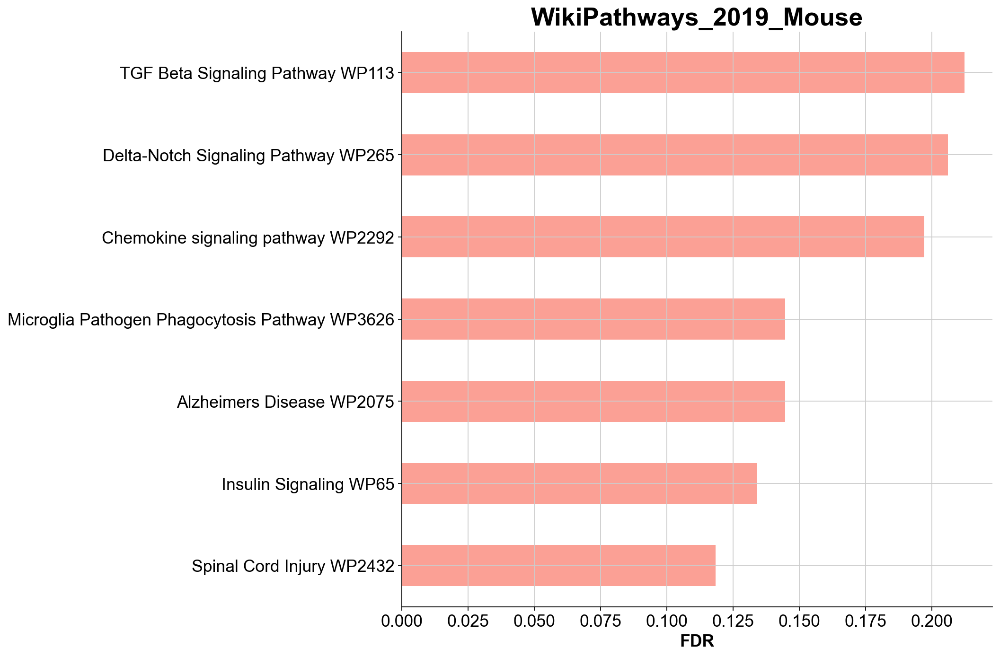

In [19]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10ra vs DN GSEA WIKI.png')

gp.barplot(top30, column='FDR', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10))

In [20]:
groups = ['IL10_Young_naive', 'DN_Young_naive']
IL10_vs_DN_GSEA = Young_naive_Ambient_RNA_cleaned_HSC[Young_naive_Ambient_RNA_cleaned_HSC.obs.IL10.isin(groups)]

In [21]:
expression_matrix_IL10_vs_DN = pd.DataFrame(IL10_vs_DN_GSEA.X)
expression_matrix_IL10_vs_DN.columns = IL10_vs_DN_GSEA.var.index
expression_matrix_IL10_vs_DN = expression_matrix_IL10_vs_DN.T
gene_list = list(IL10_vs_DN_GSEA.var.index)
column_values = pd.Series(gene_list)
expression_matrix_IL10_vs_DN.insert(loc=0, column='Description', value=column_values)
expression_matrix_IL10_vs_DN.insert(loc=0, column='NAME', value=gene_list)
expression_matrix_IL10_vs_DN['NAME'] = expression_matrix_IL10_vs_DN['NAME'].str.upper()
expression_matrix_IL10_vs_DN.index = range(len(expression_matrix_IL10_vs_DN.index))

In [22]:
phenotype_list_IL10_vs_DN = list(IL10_vs_DN_GSEA.obs.IL10)

In [23]:
gs_res_IL10_vs_DN = gp.gsea(data=expression_matrix_IL10_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Biological_Process_2021', # enrichr library names
                 cls= phenotype_list_IL10_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='gene_set',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png',)

#access the dataframe results throught res2d attribute
gs_res_IL10_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_DN_GSEA_GO_BP_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv', index=None)

significant_terms = gs_res_IL10_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

Exception: Input groups have to be 2!

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Biological_Process_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN GSEA GO BP.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Biological_Process_2021', figsize=(10,10))

In [ ]:
gs_res_IL10_vs_DN = gp.gsea(data=expression_matrix_IL10_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Molecular_Function_2021', # enrichr library names
                 cls= phenotype_list_IL10_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='gene_set',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')

#access the dataframe results throught res2d attribute
gs_res_IL10_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_DN_GSEA_GO_MF_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Molecular_Function_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN GSEA GO MF.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Molecular_Function_2021', figsize=(10,10))

In [ ]:
gs_res_IL10_vs_DN = gp.gsea(data=expression_matrix_IL10_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Cellular_Component_2021', # enrichr library names
                 cls= phenotype_list_IL10_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='gene_set',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')


#access the dataframe results throught res2d attribute
gs_res_IL10_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_DN_GSEA_GO_CC_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN GSEA GO CC.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10))

In [ ]:
gs_res_IL10_vs_DN = gp.gsea(data=expression_matrix_IL10_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='KEGG_2019_Mouse', # enrichr library names
                 cls= phenotype_list_IL10_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='gene_set',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')


#access the dataframe results throught res2d attribute
gs_res_IL10_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_DN_GSEA_KEGG_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN GSEA KEGG.png')

gp.barplot(top30, column='FDR', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10))

In [ ]:
gs_res_IL10_vs_DN = gp.gsea(data=expression_matrix_IL10_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='WikiPathways_2019_Mouse', # enrichr library names
                 cls= phenotype_list_IL10_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='gene_set',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')

#access the dataframe results throught res2d attribute
gs_res_IL10_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_DN_GSEA_WIKI_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN GSEA WIKI.png')

gp.barplot(top30, column='FDR', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10))

In [ ]:
groups = ['IL10_Young_naive', 'IL10ra_Young_naive']
IL10_vs_IL10ra_GSEA = Young_naive_Ambient_RNA_cleaned_HSC[Young_naive_Ambient_RNA_cleaned_HSC.obs.IL10.isin(groups)]

In [ ]:
expression_matrix_IL10_vs_IL10ra = pd.DataFrame(IL10_vs_IL10ra_GSEA.X)
expression_matrix_IL10_vs_IL10ra.columns = IL10_vs_IL10ra_GSEA.var.index
expression_matrix_IL10_vs_IL10ra = expression_matrix_IL10_vs_IL10ra.T
gene_list = list(IL10_vs_IL10ra_GSEA.var.index)
column_values = pd.Series(gene_list)
expression_matrix_IL10_vs_IL10ra.insert(loc=0, column='Description', value=column_values)
expression_matrix_IL10_vs_IL10ra.insert(loc=0, column='NAME', value=gene_list)
expression_matrix_IL10_vs_IL10ra['NAME'] = expression_matrix_IL10_vs_IL10ra['NAME'].str.upper()
expression_matrix_IL10_vs_IL10ra.index = range(len(expression_matrix_IL10_vs_IL10ra.index))

In [ ]:
phenotype_list_IL10_vs_IL10ra = list(IL10_vs_IL10ra_GSEA.obs.IL10)

In [ ]:
gs_res_IL10_vs_IL10ra = gp.gsea(data=expression_matrix_IL10_vs_IL10ra, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Biological_Process_2021', # enrichr library names
                 cls= phenotype_list_IL10_vs_IL10ra, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='gene_set',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png',)

#access the dataframe results throught res2d attribute
gs_res_IL10_vs_IL10ra.res2d.to_csv('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_GSEA_GO_BP_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv', index=None)

significant_terms = gs_res_IL10_vs_IL10ra.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Biological_Process_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs IL10ra GSEA GO BP.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Biological_Process_2021', figsize=(10,10))

In [ ]:
gs_res_IL10_vs_IL10ra = gp.gsea(data=expression_matrix_IL10_vs_IL10ra, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Molecular_Function_2021', # enrichr library names
                 cls= phenotype_list_IL10_vs_IL10ra, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='gene_set',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')

#access the dataframe results throught res2d attribute
gs_res_IL10_vs_IL10ra.res2d.to_csv('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_GSEA_GO_MF_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_IL10ra.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Molecular_Function_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs IL10ra GSEA GO MF.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Molecular_Function_2021', figsize=(10,10))

In [ ]:
gs_res_IL10_vs_IL10ra = gp.gsea(data=expression_matrix_IL10_vs_IL10ra, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Cellular_Component_2021', # enrichr library names
                 cls= phenotype_list_IL10_vs_IL10ra, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='gene_set',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')


#access the dataframe results throught res2d attribute
gs_res_IL10_vs_IL10ra.res2d.to_csv('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_GSEA_GO_CC_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_IL10ra.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs IL10ra GSEA GO CC.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10))

In [ ]:
gs_res_IL10_vs_IL10ra = gp.gsea(data=expression_matrix_IL10_vs_IL10ra, # or data='./P53_resampling_data.txt'
                 gene_sets='KEGG_2019_Mouse', # enrichr library names
                 cls= phenotype_list_IL10_vs_IL10ra, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='gene_set',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')


#access the dataframe results throught res2d attribute
gs_res_IL10_vs_IL10ra.res2d.to_csv('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_GSEA_KEGG_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_IL10ra.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs IL10ra GSEA KEGG.png')

gp.barplot(top30, column='FDR', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10))

In [ ]:
gs_res_IL10_vs_IL10ra = gp.gsea(data=expression_matrix_IL10_vs_IL10ra, # or data='./P53_resampling_data.txt'
                 gene_sets='WikiPathways_2019_Mouse', # enrichr library names
                 cls= phenotype_list_IL10_vs_IL10ra, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='gene_set',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')

#access the dataframe results throught res2d attribute
gs_res_IL10_vs_IL10ra.res2d.to_csv('/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_GSEA_WIKI_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_IL10ra.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs IL10ra GSEA WIKI.png')

gp.barplot(top30, column='FDR', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10))

In [24]:
sc.tl.rank_genes_groups(Young_naive_Ambient_RNA_cleaned_HSC, 'IL10', groups = ['IL10ra_Young_naive'], reference = 'DN_Young_naive', method='wilcoxon', corr_method='bonferroni', key_added = 'wilcoxon_bonferroni_Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN', use_raw=False)
result = Young_naive_Ambient_RNA_cleaned_HSC.uns['wilcoxon_bonferroni_Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals', 'pvals_adj']}).head(10)

Trying to set attribute `._uns` of view, copying.


,IL10ra_Young_naive_n,IL10ra_Young_naive_p
0,Cd52,0.616476
1,Cd53,1.000000
2,Flt3,1.000000
3,Selenop,1.000000
4,Calcrl,1.000000
5,Slc12a6,1.000000
6,Pitpna,1.000000
7,Ccdc50,1.000000
8,Ehmt1,1.000000
9,Rock2,1.000000


In [25]:
volcano_Young_naive_Ambient_RNA_cleaned_HSC = sc.get.rank_genes_groups_df(Young_naive_Ambient_RNA_cleaned_HSC, group=None, key='wilcoxon_bonferroni_Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN')
volcano_Young_naive_Ambient_RNA_cleaned_HSC.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_DGE_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [26]:
volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered = volcano_Young_naive_Ambient_RNA_cleaned_HSC[volcano_Young_naive_Ambient_RNA_cleaned_HSC['pvals_adj'] < 0.05]
volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered['log_pvals_adj'] = -np.log10(volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered['pvals_adj'])
volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered.reset_index(inplace=True, drop=True)
volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_005_DGE_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")
volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered

/tmp/ipykernel_1223862/1806863860.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered['log_pvals_adj'] = -np.log10(volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered['pvals_adj'])


,names,scores,logfoldchanges,pvals,pvals_adj,log_pvals_adj
0,Ppia,-4.738275,0.631238,0.000002,0.007303,2.136517


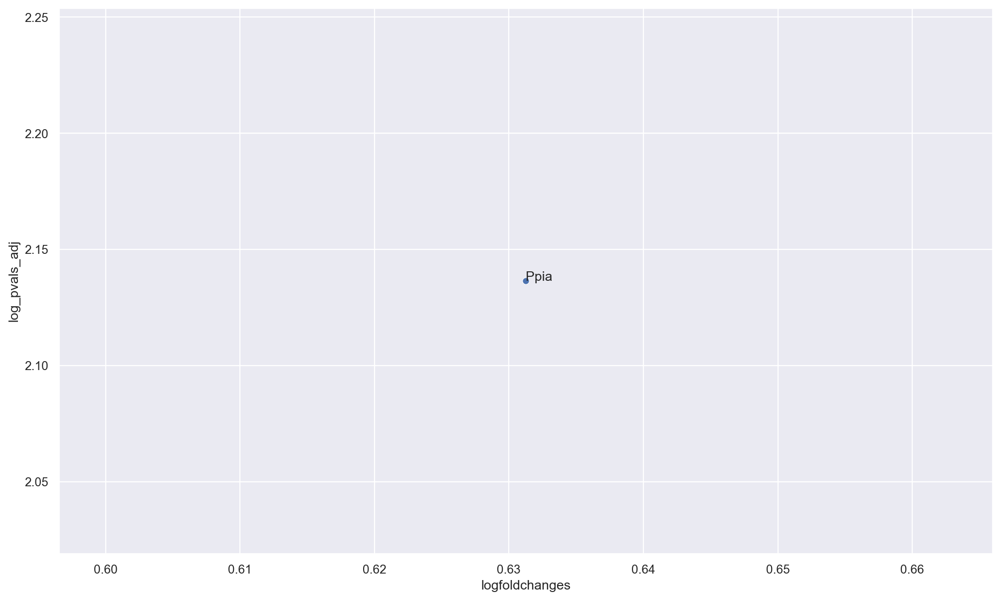

In [27]:
import matplotlib.pylab as plt
from matplotlib.pyplot import rc_context
import seaborn as sns
sc.settings.set_figure_params(dpi=80, facecolor='white')

sns.set(rc={"figure.figsize":(15, 9)})

sns.scatterplot(data=volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered, x='logfoldchanges', y= 'log_pvals_adj')
for line in range(0,volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered.shape[0]):
     plt.text(volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered.logfoldchanges[line], volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered.log_pvals_adj[line], volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered.names[line])
plt.show()

In [28]:
import gseapy
gene_set_names = gseapy.get_library_name(organism='Mouse')

In [29]:
glist_Young_naive = sc.get.rank_genes_groups_df(Young_naive_Ambient_RNA_cleaned_HSC, group='IL10ra_Young_naive', key='wilcoxon_bonferroni_Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN', pval_cutoff=0.05, log2fc_min=0.000000000001)['names'].squeeze().str.strip().tolist()

enr_res_Young_naive_Ambient_RNA_cleaned_process = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['GO_Biological_Process_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_process.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_upregulated_DGEs_GO_BP_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

AttributeError: 'str' object has no attribute 'str'

In [ ]:
glist_Young_naive.shape

In [ ]:
significant_terms.shape

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10ra vs DN Upregulated DGEs GO BP.png')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_function = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['GO_Molecular_Function_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_function.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_function.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_upregulated_DGEs_GO_MF_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Molecular_Function', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10ra vs DN Upregulated DGEs GO MF.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Molecular_Function', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_cell_component = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['GO_Cellular_Component_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_cell_component.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_cell_component.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_upregulated_DGEs_GO_CC_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10ra vs DN Upregulated DGEs GO CC.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Cellular_Component_2021', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_KEGG = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['KEGG_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_KEGG.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_upregulated_DGEs_KEGG_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10ra vs DN Upregulated DGEs KEGG.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='KEGG_2019_Mouse', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_WIKI = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['WikiPathways_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_WIKI.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_upregulated_DGEs_WIKI_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10ra vs DN Upregulated DGEs WIKI.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='WikiPathways_2019_Mouse', figsize=(10,10))

In [ ]:
glist_Young_naive = sc.get.rank_genes_groups_df(Young_naive_Ambient_RNA_cleaned_HSC, group='IL10ra_Young_naive', key='wilcoxon_bonferroni_Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN', pval_cutoff=0.05, log2fc_max=-0.000000000001)['names'].squeeze().str.strip().tolist()

enr_res_Young_naive_Ambient_RNA_cleaned_process = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['GO_Biological_Process_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_process.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_downregulated_DGEs_GO_BP_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
glist_Young_naive.shape

In [ ]:
significant_terms.shape

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10ra vs DN Downregulated DGEs GO BP.png')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_function = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['GO_Molecular_Function_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_function.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_function.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_downregulated_DGEs_GO_MF_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Molecular_Function', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10ra vs DN Downregulated DGEs GO MF.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Molecular_Function', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_cell_component = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['GO_Cellular_Component_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_cell_component.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_cell_component.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_downregulated_DGEs_GO_CC_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10ra vs DN Downregulated DGEs GO CC.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Cellular_Component_2021', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_KEGG = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['KEGG_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_KEGG.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_downregulated_DGEs_KEGG_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10ra vs DN Downregulated DGEs KEGG.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='KEGG_2019_Mouse', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_WIKI = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['WikiPathways_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_WIKI.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_downregulated_DGEs_WIKI_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10ra vs DN Downregulated DGEs WIKI.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='WikiPathways_2019_Mouse', figsize=(10,10))

In [ ]:
sc.tl.rank_genes_groups(Young_naive_Ambient_RNA_cleaned_HSC, 'IL10', groups = ['IL10_Young_naive'], reference = 'DN_Young_naive', method='wilcoxon', corr_method='bonferroni', key_added = 'wilcoxon_bonferroni_Young_naive_Ambient_RNA_cleaned_IL10_vs_DN')
result = Young_naive_Ambient_RNA_cleaned_HSC.uns['wilcoxon_bonferroni_Young_naive_Ambient_RNA_cleaned_IL10_vs_DN']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals', 'pvals_adj']}).head(10)

In [ ]:
volcano_Young_naive_Ambient_RNA_cleaned_HSC = sc.get.rank_genes_groups_df(Young_naive_Ambient_RNA_cleaned_HSC, group=None, key='wilcoxon_bonferroni_Young_naive_Ambient_RNA_cleaned_IL10_vs_DN')
volcano_Young_naive_Ambient_RNA_cleaned_HSC.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_DN_DGE_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_raw_SingleR_beforehand.csv")

In [ ]:
volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered = volcano_Young_naive_Ambient_RNA_cleaned_HSC[volcano_Young_naive_Ambient_RNA_cleaned_HSC['pvals_adj'] < 0.05]
volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered['log_pvals_adj'] = -np.log10(volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered['pvals_adj'])
volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered.reset_index(inplace=True, drop=True)
volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_DN_005_DGE_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_raw_SingleR_beforehand.csv")
volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

sns.set(rc={"figure.figsize":(15, 9)})

sns.scatterplot(data=volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered, x='logfoldchanges', y= 'log_pvals_adj')
for line in range(0,volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered.shape[0]):
     plt.text(volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered.logfoldchanges[line], volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered.log_pvals_adj[line], volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered.names[line])
plt.show()

In [ ]:
import gseapy
gene_set_names = gseapy.get_library_name(organism='Mouse')

In [ ]:
glist_Young_naive = sc.get.rank_genes_groups_df(Young_naive_Ambient_RNA_cleaned_HSC, group='IL10_Young_naive', key='wilcoxon_bonferroni_Young_naive_Ambient_RNA_cleaned_IL10_vs_DN', pval_cutoff=0.05, log2fc_min=0.000000000001)['names'].squeeze().str.strip().tolist()

enr_res_Young_naive_Ambient_RNA_cleaned_process = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['GO_Biological_Process_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_process.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_upregulated_DGEs_GO_BP_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
glist_Young_naive.shape

In [ ]:
significant_terms.shape

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Upregulated DGEs GO BP.png')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_function = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['GO_Molecular_Function_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_function.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_function.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_upregulated_DGEs_GO_MF_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Molecular_Function', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Upregulated DGEs GO MF.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Molecular_Function', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_cell_component = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['GO_Cellular_Component_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_cell_component.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_cell_component.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_upregulated_DGEs_GO_CC_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Upregulated DGEs GO CC.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Cellular_Component_2021', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_KEGG = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['KEGG_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_KEGG.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_upregulated_DGEs_KEGG_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Upregulated DGEs KEGG.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='KEGG_2019_Mouse', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_WIKI = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['WikiPathways_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_WIKI.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_upregulated_DGEs_WIKI_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Upregulated DGEs WIKI.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='WikiPathways_2019_Mouse', figsize=(10,10))

In [ ]:
glist_Young_naive = sc.get.rank_genes_groups_df(Young_naive_Ambient_RNA_cleaned_HSC, group='IL10_Young_naive', key='wilcoxon_bonferroni_Young_naive_Ambient_RNA_cleaned_IL10_vs_DN', pval_cutoff=0.05, log2fc_max=-0.000000000001)['names'].squeeze().str.strip().tolist()

enr_res_Young_naive_Ambient_RNA_cleaned_process = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['GO_Biological_Process_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_process.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_downregulated_DGEs_GO_BP_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
glist_Young_naive.shape

In [ ]:
significant_terms.shape

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Downregulated DGEs GO BP.png')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_function = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['GO_Molecular_Function_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_function.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_function.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_downregulated_DGEs_GO_MF_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Molecular_Function', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Downregulated DGEs GO MF.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Molecular_Function', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_cell_component = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['GO_Cellular_Component_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_cell_component.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_cell_component.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_downregulated_DGEs_GO_CC_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Downregulated DGEs GO CC.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Cellular_Component_2021', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_KEGG = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['KEGG_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_KEGG.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_downregulated_DGEs_KEGG_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Downregulated DGEs KEGG.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='KEGG_2019_Mouse', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_WIKI = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['WikiPathways_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_WIKI.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_downregulated_DGEs_WIKI_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Downregulated DGEs WIKI.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='WikiPathways_2019_Mouse', figsize=(10,10))

In [ ]:
sc.tl.rank_genes_groups(Young_naive_Ambient_RNA_cleaned_HSC, 'IL10', groups = ['IL10_Young_naive'], reference = 'IL10ra_Young_naive', method='wilcoxon', corr_method='bonferroni', key_added = 'wilcoxon_bonferroni_Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra')
result = Young_naive_Ambient_RNA_cleaned_HSC.uns['wilcoxon_bonferroni_Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals', 'pvals_adj']}).head(10)

In [ ]:
volcano_Young_naive_Ambient_RNA_cleaned_HSC = sc.get.rank_genes_groups_df(Young_naive_Ambient_RNA_cleaned_HSC, group=None, key='wilcoxon_bonferroni_Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra')
volcano_Young_naive_Ambient_RNA_cleaned_HSC.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_DGE_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_raw_SingleR_beforehand.csv")

In [ ]:
volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered = volcano_Young_naive_Ambient_RNA_cleaned_HSC[volcano_Young_naive_Ambient_RNA_cleaned_HSC['pvals_adj'] < 0.05]
volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered['log_pvals_adj'] = -np.log10(volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered['pvals_adj'])
volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered.reset_index(inplace=True, drop=True)
volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_005_DGE_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_raw_SingleR_beforehand.csv")
volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

sns.set(rc={"figure.figsize":(15, 9)})

sns.scatterplot(data=volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered, x='logfoldchanges', y= 'log_pvals_adj')
for line in range(0,volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered.shape[0]):
     plt.text(volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered.logfoldchanges[line], volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered.log_pvals_adj[line], volcano_Young_naive_Ambient_RNA_cleaned_HSC_filtered.names[line])
plt.show()

In [ ]:
import gseapy
gene_set_names = gseapy.get_library_name(organism='Mouse')

In [ ]:
glist_Young_naive = sc.get.rank_genes_groups_df(Young_naive_Ambient_RNA_cleaned_HSC, group='IL10_Young_naive', key='wilcoxon_bonferroni_Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra', pval_cutoff=0.05, log2fc_min=0.000000000001)['names'].squeeze().str.strip().tolist()

enr_res_Young_naive_Ambient_RNA_cleaned_process = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['GO_Biological_Process_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_process.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_upregulated_DGEs_GO_BP_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
glist_Young_naive.shape

In [ ]:
significant_terms.shape

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Upregulated DGEs GO BP.png')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_function = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['GO_Molecular_Function_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_function.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_function.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_upregulated_DGEs_GO_MF_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Molecular_Function', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Upregulated DGEs GO MF.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Molecular_Function', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_cell_component = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['GO_Cellular_Component_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_cell_component.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_cell_component.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_upregulated_DGEs_GO_CC_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Upregulated DGEs GO CC.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Cellular_Component_2021', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_KEGG = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['KEGG_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_KEGG.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_upregulated_DGEs_KEGG_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Upregulated DGEs KEGG.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='KEGG_2019_Mouse', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_WIKI = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['WikiPathways_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_WIKI.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_upregulated_DGEs_WIKI_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Upregulated DGEs WIKI.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='WikiPathways_2019_Mouse', figsize=(10,10))

In [ ]:
glist_Young_naive = sc.get.rank_genes_groups_df(Young_naive_Ambient_RNA_cleaned_HSC, group='IL10_Young_naive', key='wilcoxon_bonferroni_Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra', pval_cutoff=0.05, log2fc_max=-0.000000000001)['names'].squeeze().str.strip().tolist()

enr_res_Young_naive_Ambient_RNA_cleaned_process = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['GO_Biological_Process_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_process.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_downregulated_DGEs_GO_BP_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
glist_Young_naive.shape

In [ ]:
significant_terms.shape

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Downregulated DGEs GO BP.png')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_function = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['GO_Molecular_Function_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_function.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_function.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_downregulated_DGEs_GO_MF_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Molecular_Function', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Downregulated DGEs GO MF.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Molecular_Function', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_cell_component = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['GO_Cellular_Component_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_cell_component.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_cell_component.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_downregulated_DGEs_GO_CC_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Downregulated DGEs GO CC.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Cellular_Component_2021', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_KEGG = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['KEGG_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_KEGG.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_downregulated_DGEs_KEGG_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Downregulated DGEs KEGG.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='KEGG_2019_Mouse', figsize=(10,10))

In [ ]:
enr_res_Young_naive_Ambient_RNA_cleaned_WIKI = gseapy.enrichr(gene_list=glist_Young_naive, organism='Mouse', gene_sets=['WikiPathways_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Young_naive_Ambient_RNA_cleaned_WIKI.res2d[enr_res_Young_naive_Ambient_RNA_cleaned_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Young_naive/write/Ambient_RNA_Cleaned/Young_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_downregulated_DGEs_WIKI_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Young naive IL10 vs DN Downregulated DGEs WIKI.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='WikiPathways_2019_Mouse', figsize=(10,10))